# WGA Segmentation

In [1]:
import os
import numpy as np
import pandas as pd

from scportrait.pipeline.featurization import CellFeaturizer
from scportrait.pipeline.extraction import HDF5CellExtraction
from scportrait.pipeline.project import Project
from scportrait.pipeline.segmentation.workflows import WGASegmentation
from scportrait.pipeline.selection import LMDSelection

In [2]:
project_location = "project_WGA"

project = Project(
    os.path.abspath(project_location),
    config_path="config_example1_WGASegmentation.yml",
    overwrite=True,
    debug=True,
    segmentation_f=WGASegmentation,
    extraction_f=HDF5CellExtraction,
    featurization_f=CellFeaturizer,
    selection_f=LMDSelection,
)

Updating project config file.
[20/03/2025 14:00:54] Loading config from /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/config.yml
INFO     The Zarr backing store has been changed from None the new file path:                                      
         /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/scport
         rait.sdata                                                                                                
[20/03/2025 14:00:54] No cache directory specified in config using current working directory /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1.
[20/03/2025 14:00:54] Compression algorithm for extracted single-cell images: lzf
[20/03/2025 14:00:54] No cache directory specified in config using current working directory /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1.


In [3]:
from scportrait.data._datasets import dataset_1

dataset_1_path = dataset_1()

# these example images are downloaded from the human protein atlas (www.proteinatlas.org)
images = [f"{dataset_1_path}/Ch1.tif", f"{dataset_1_path}/Ch2.tif", f"{dataset_1_path }/Ch3.tif"]

project.load_input_from_tif_files(images, channel_names = ["Hoechst", "Alexa488", "mCherry"])

[20/03/2025 14:00:59] Initialized temporary directory at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/Project_48bmsynx for Project
[20/03/2025 14:00:59] Image input_image written to sdata object.
[20/03/2025 14:01:00] Cleaned up temporary directory at <TemporaryDirectory '/Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/Project_48bmsynx'>


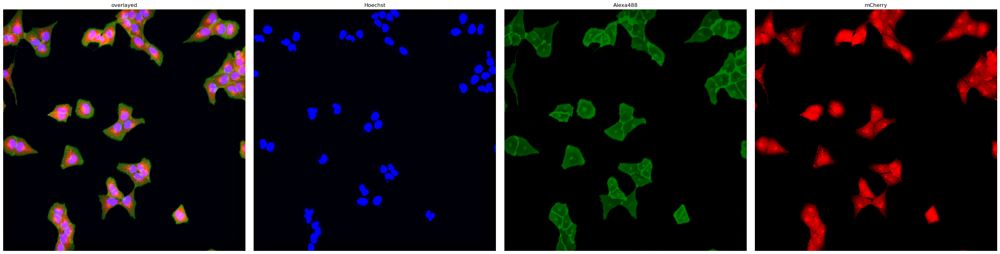

In [4]:
project.plot_input_image()

[20/03/2025 14:01:03] Normalization of the input image will be performed.
[20/03/2025 14:01:03] Normalizing each channel to the same range
[20/03/2025 14:01:04] Performing median filtering on input image
[20/03/2025 14:01:14] Percentile normalization of nucleus input image to range 0.01, 0.99
[20/03/2025 14:01:14] Normalizing each channel to the same range
[20/03/2025 14:01:15] Using local thresholding with a threshold of 0.2 to calculate nucleus mask.


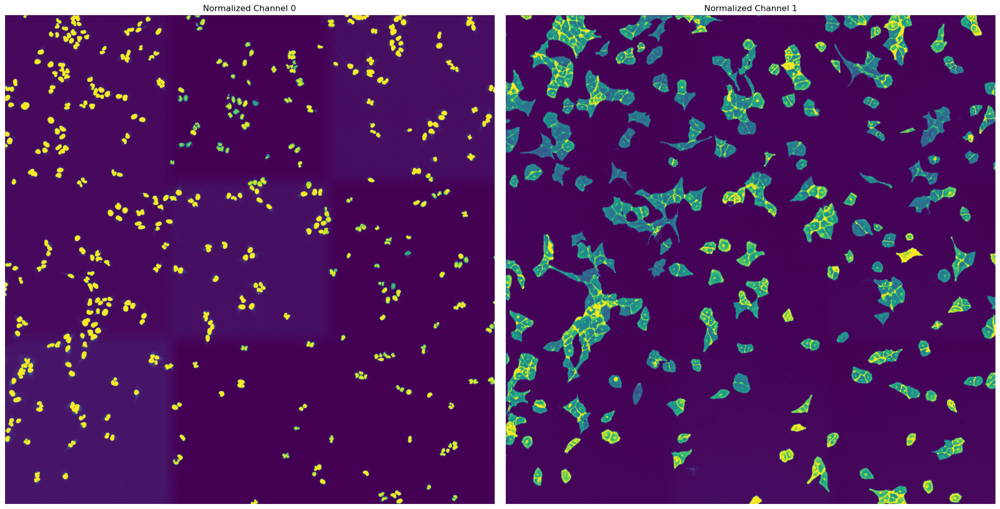

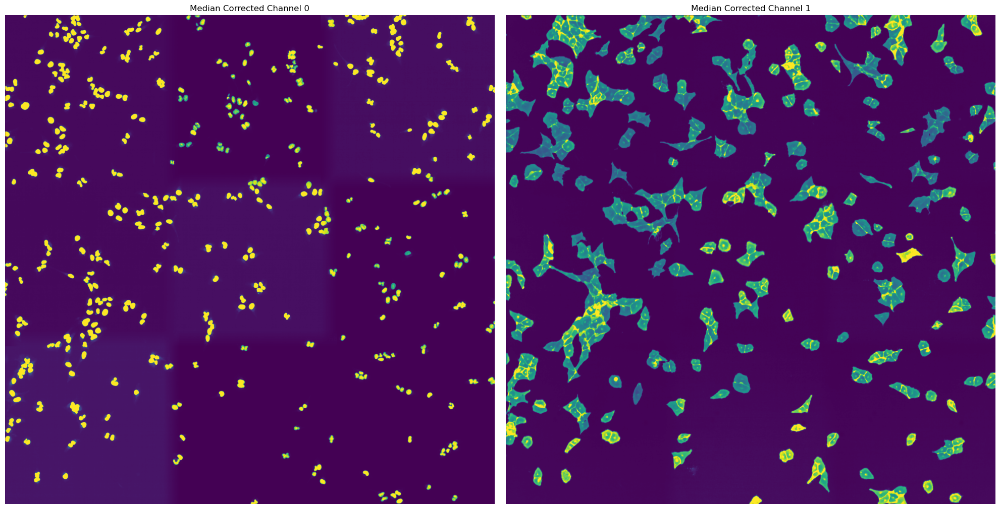

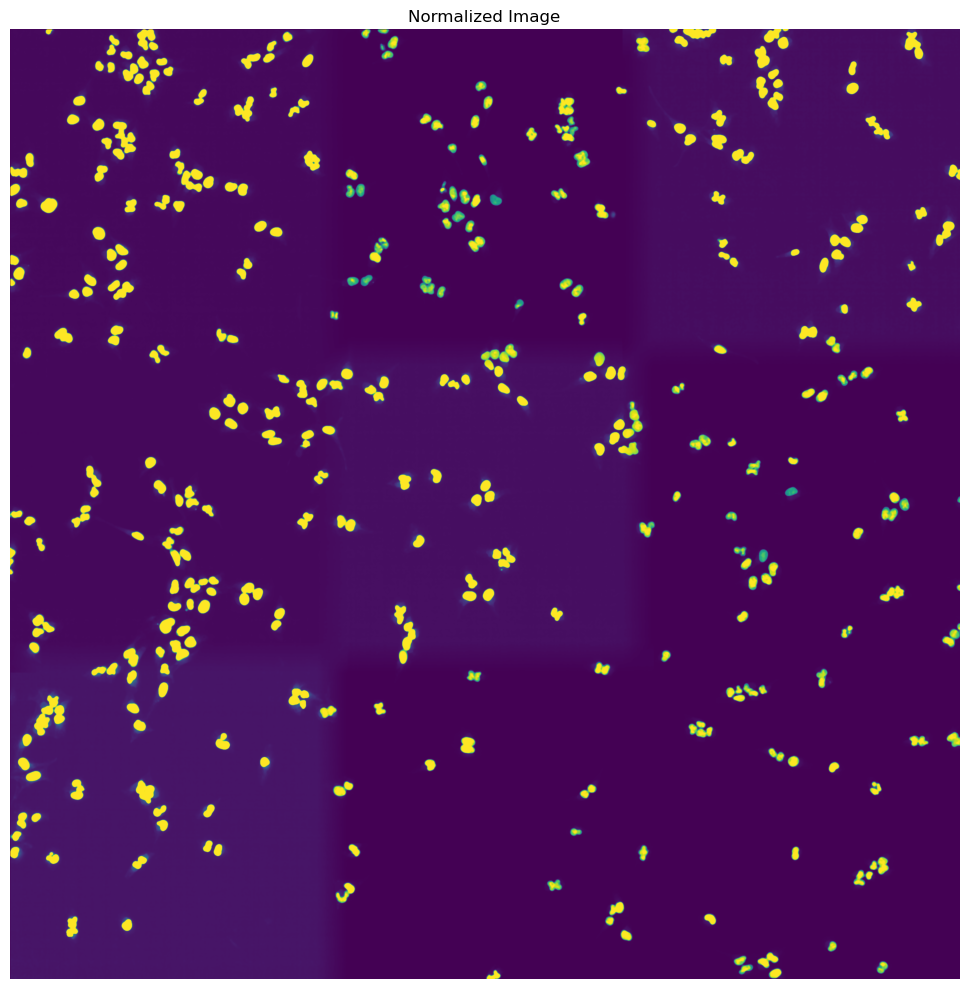

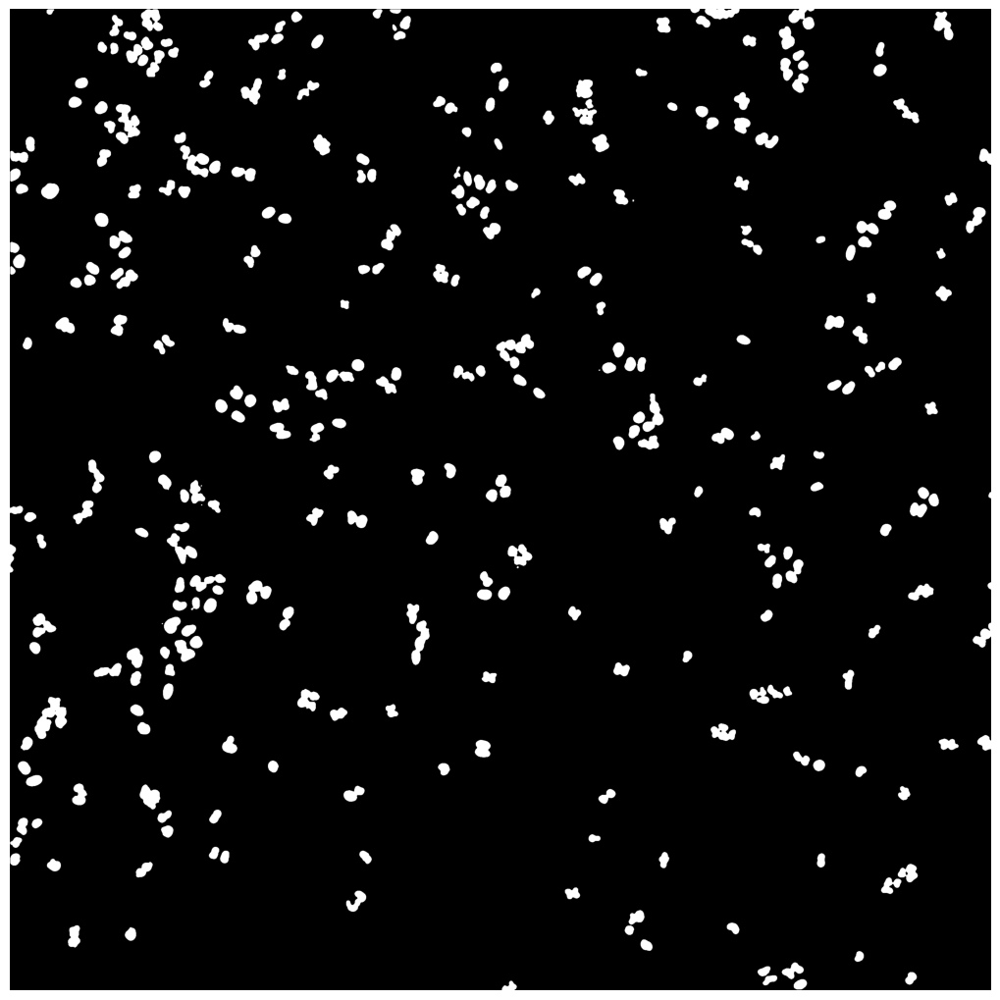

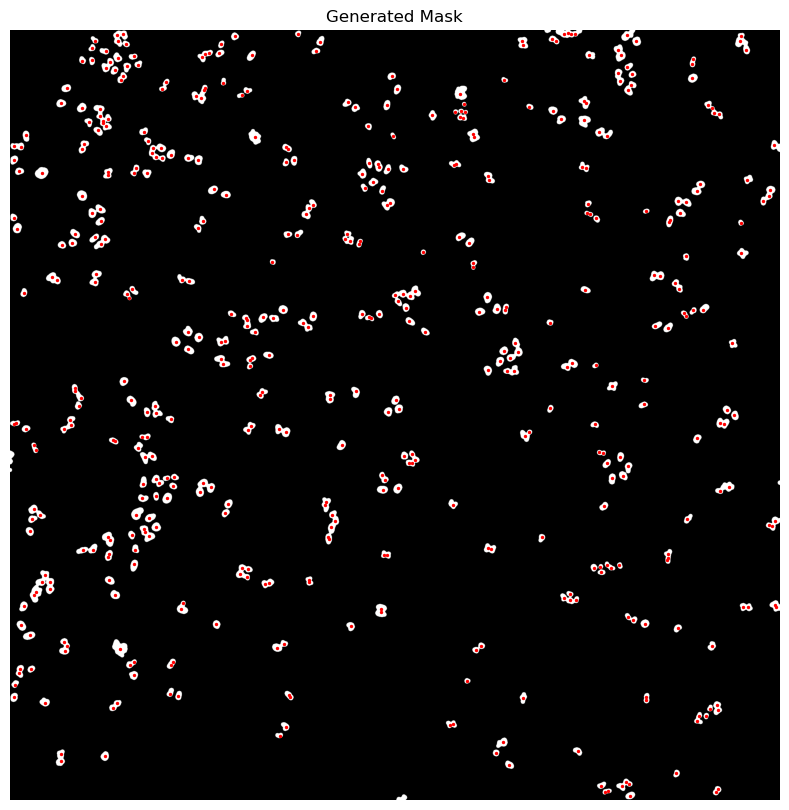

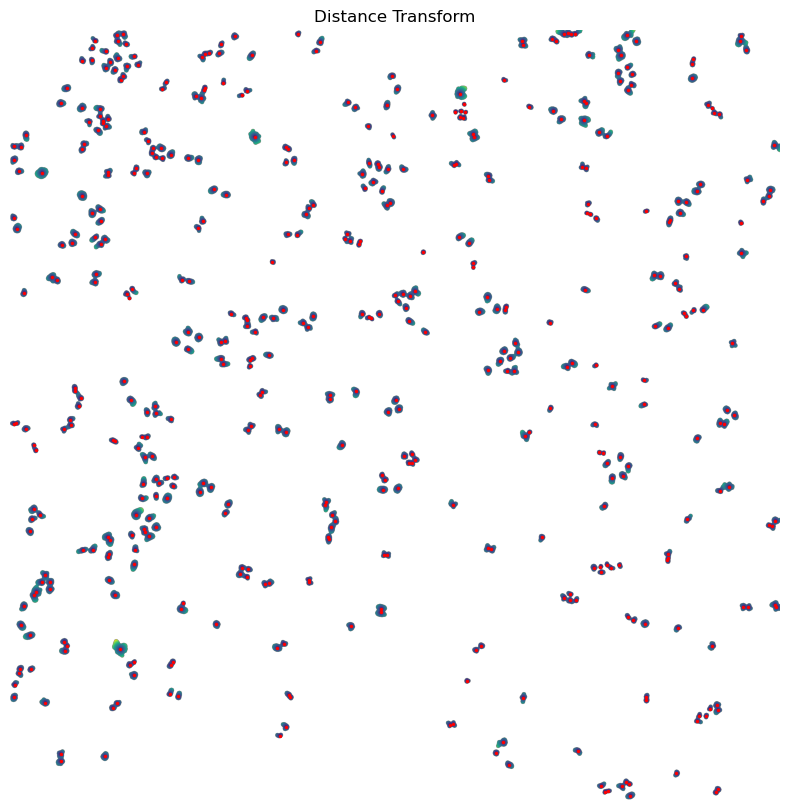

[20/03/2025 14:01:32] Performing filtering of nucleus with specified thresholds [200, 1000] from config file.
[20/03/2025 14:01:32] Removed 46 nuclei as they fell outside of the threshold range [200, 1000].
[20/03/2025 14:01:33] Total time to perform nucleus size filtering: 0.968123197555542 seconds


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


[20/03/2025 14:01:34] Filtered out 6 nuclei due to contact filtering.
[20/03/2025 14:01:34] Normalizing each channel to the same range
[20/03/2025 14:01:37] Cytosol Potential Mask generated.
[20/03/2025 14:01:39] Performing filtering of cytosol with specified thresholds [200, 6000] from config file.


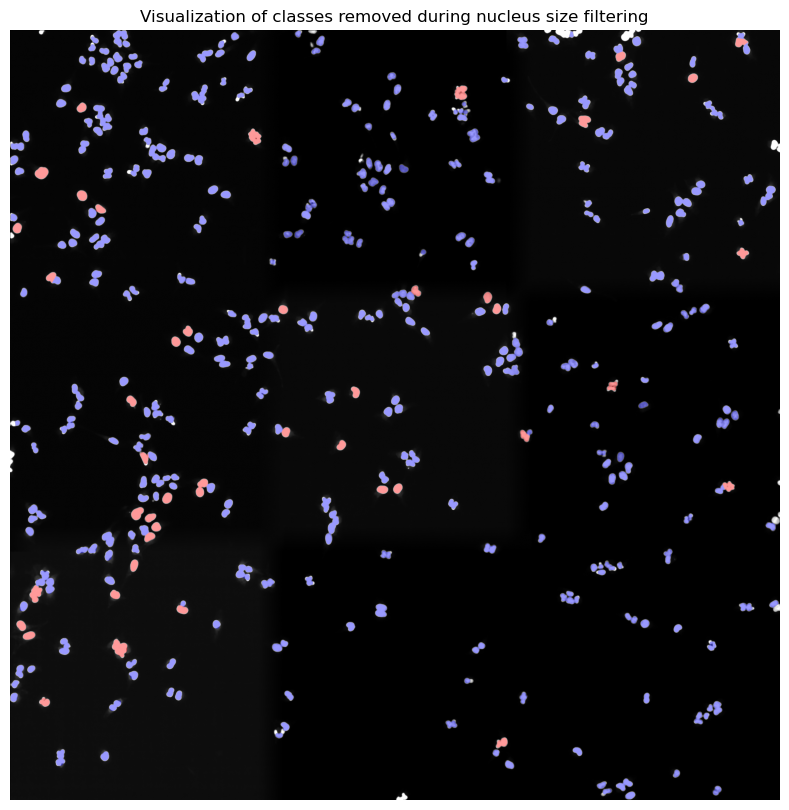

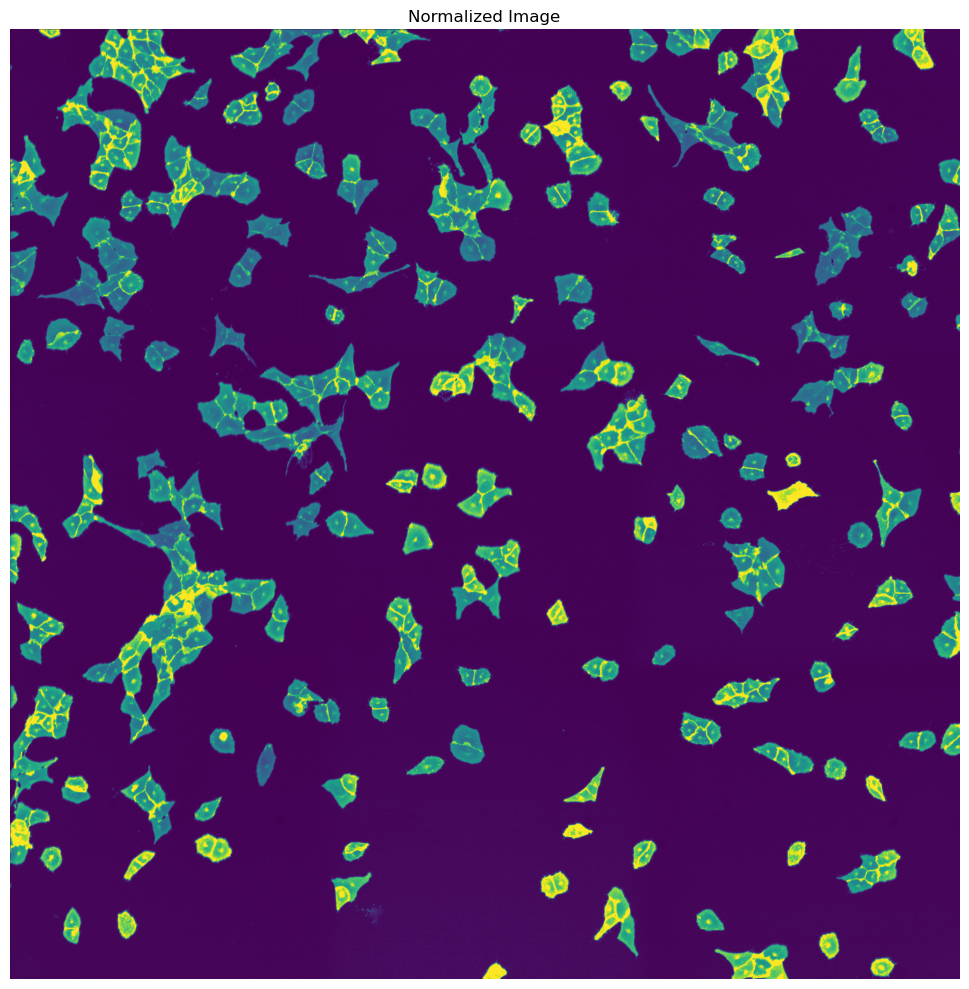

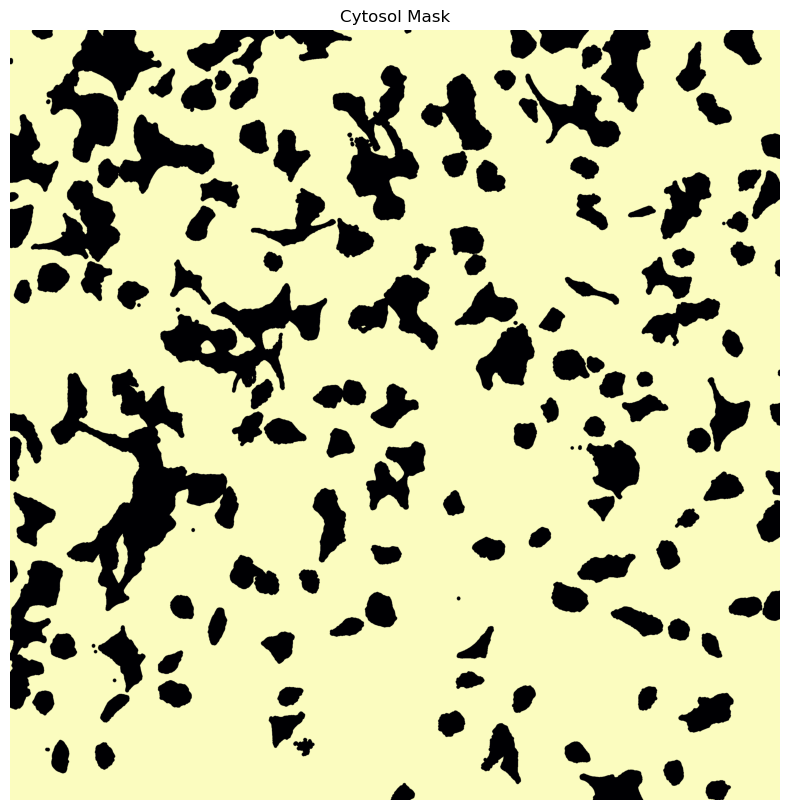

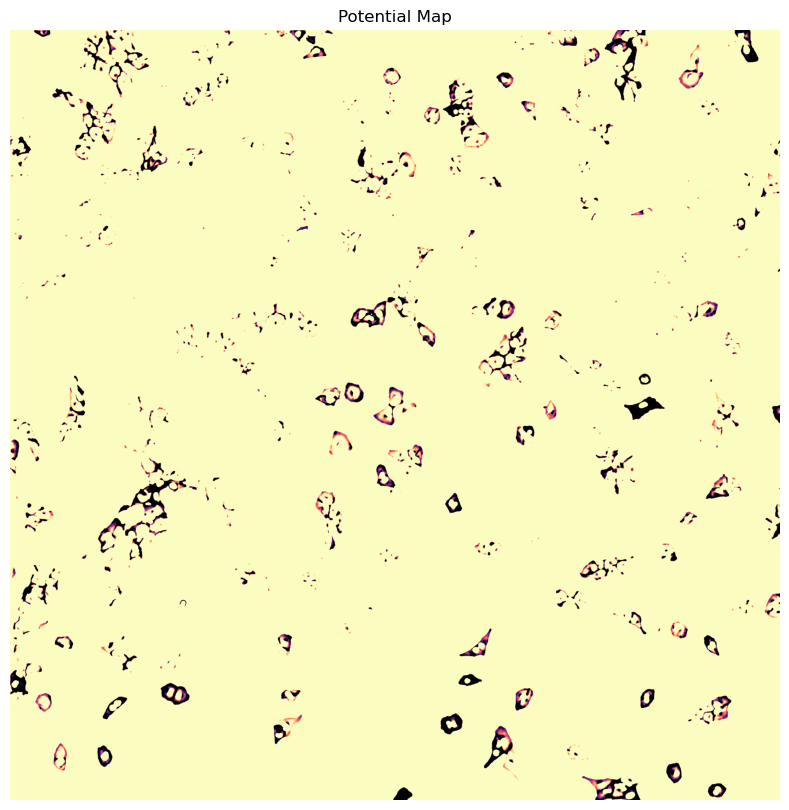

[20/03/2025 14:01:42] Removed 78 nuclei as they fell outside of the threshold range [200, 6000].
[20/03/2025 14:01:43] Total time to perform cytosol size filtering: 3.8774490356445312 seconds
[20/03/2025 14:01:44] Segmentation seg_all_nucleus written to sdata object.
[20/03/2025 14:01:46] Points centers_seg_all_nucleus written to sdata object.
[20/03/2025 14:01:46] Segmentation seg_all_cytosol written to sdata object.
[20/03/2025 14:01:46] Points centers_seg_all_cytosol written to sdata object.


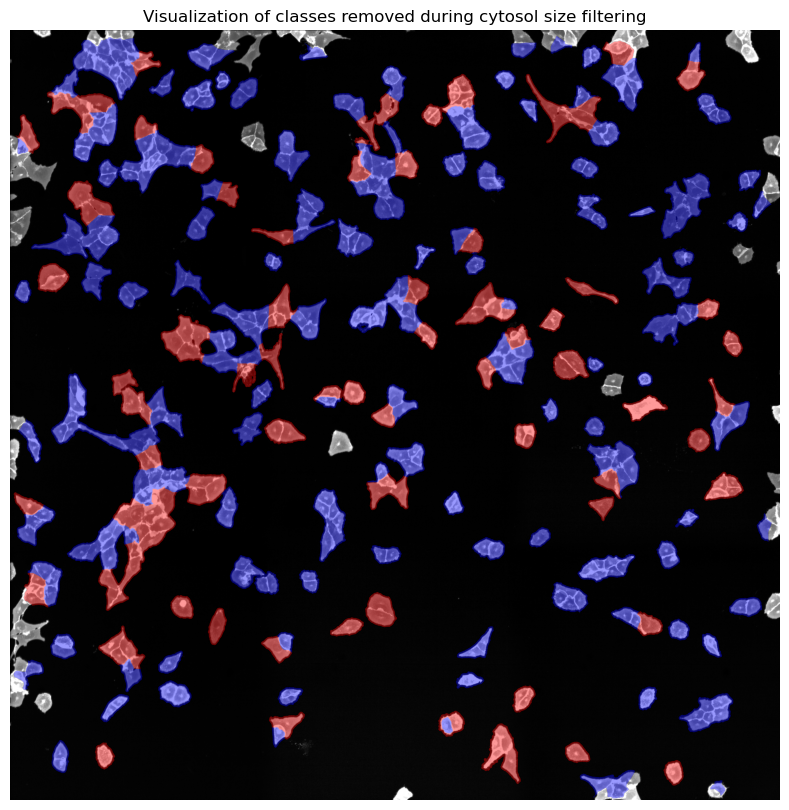

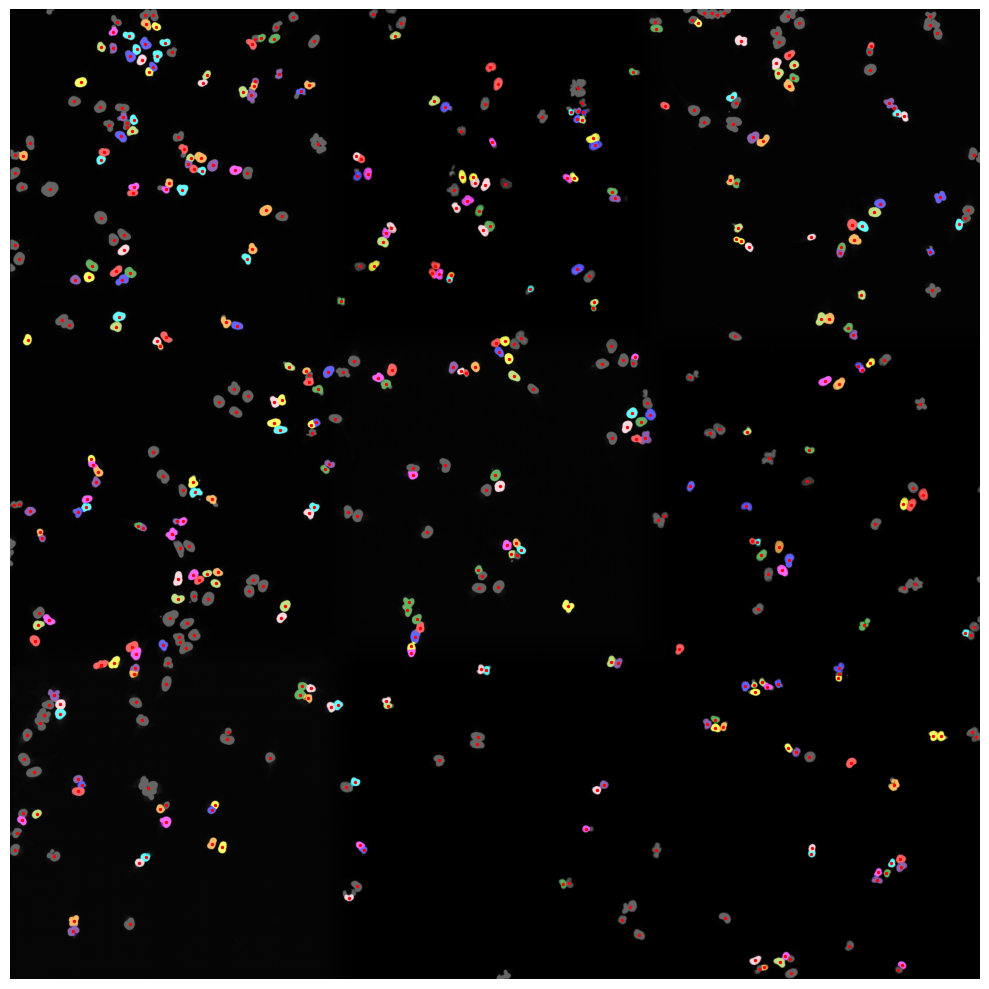

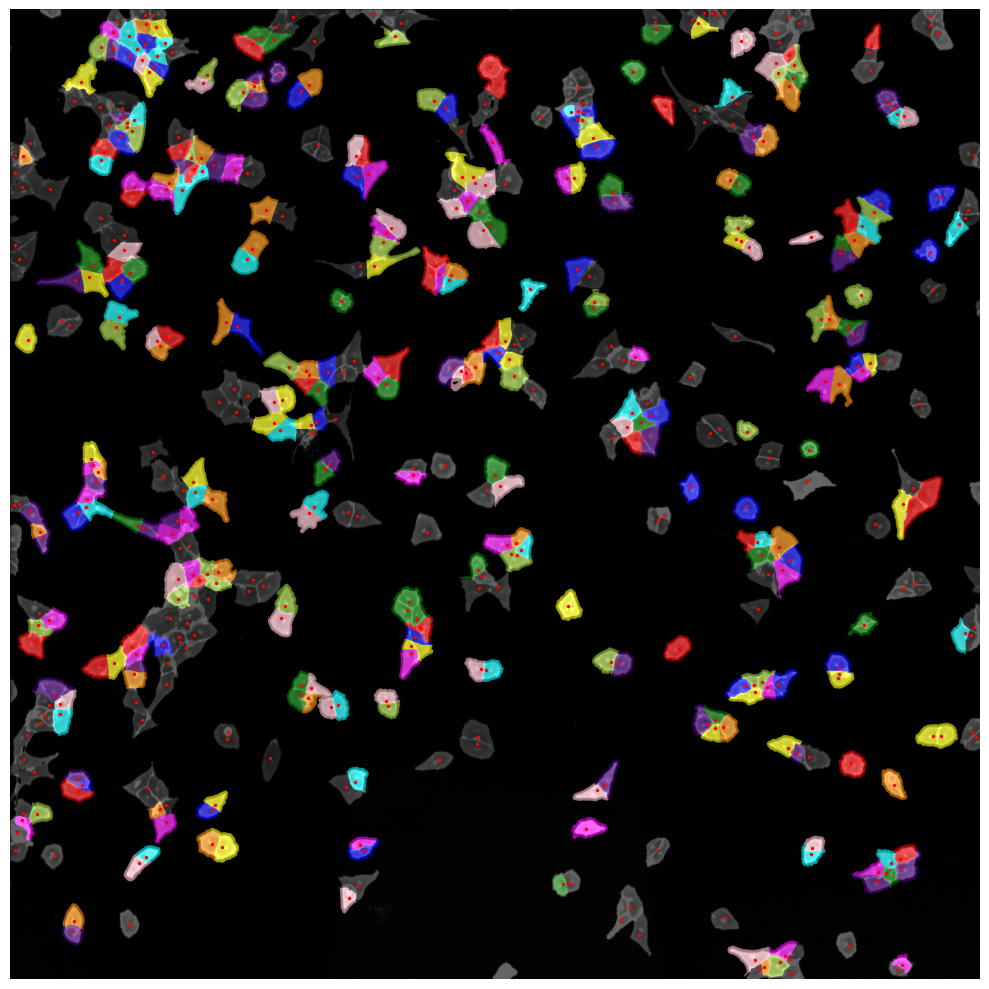

In [5]:
project.segment()

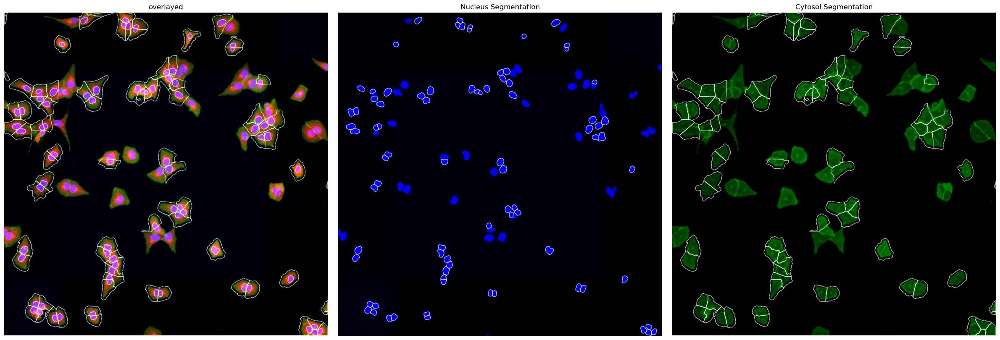

In [6]:
project.plot_segmentation_masks()

In [7]:
project.extract()

[20/03/2025 14:01:54] Initialized temporary directory at /var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/./HDF5CellExtraction_ioytg6h2 for HDF5CellExtraction
[20/03/2025 14:01:54] Created new directory for extraction results: /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/extraction/data
[20/03/2025 14:01:54] Setup output folder at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/extraction/data
[20/03/2025 14:01:54] Found 2 segmentation masks for the given key in the sdata object. Will be extracting single-cell images based on these masks: ['seg_all_nucleus', 'seg_all_cytosol']
[20/03/2025 14:01:54] Using seg_all_nucleus as the main segmentation mask to determine cell centers.
[20/03/2025 14:01:54] A total of 13 cells were too close to the image border to be extracted. Their cell_ids were saved to file /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/ex

Extracting cell batches:   0%|          | 0/4 [00:00<?, ?it/s]

[20/03/2025 14:02:00] Finished extraction in 5.70 seconds (55.07 cells / second)
[20/03/2025 14:02:00] Benchmarking times saved to file.
[20/03/2025 14:02:00] Cleaned up temporary directory at <TemporaryDirectory '/var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/./HDF5CellExtraction_ioytg6h2'>


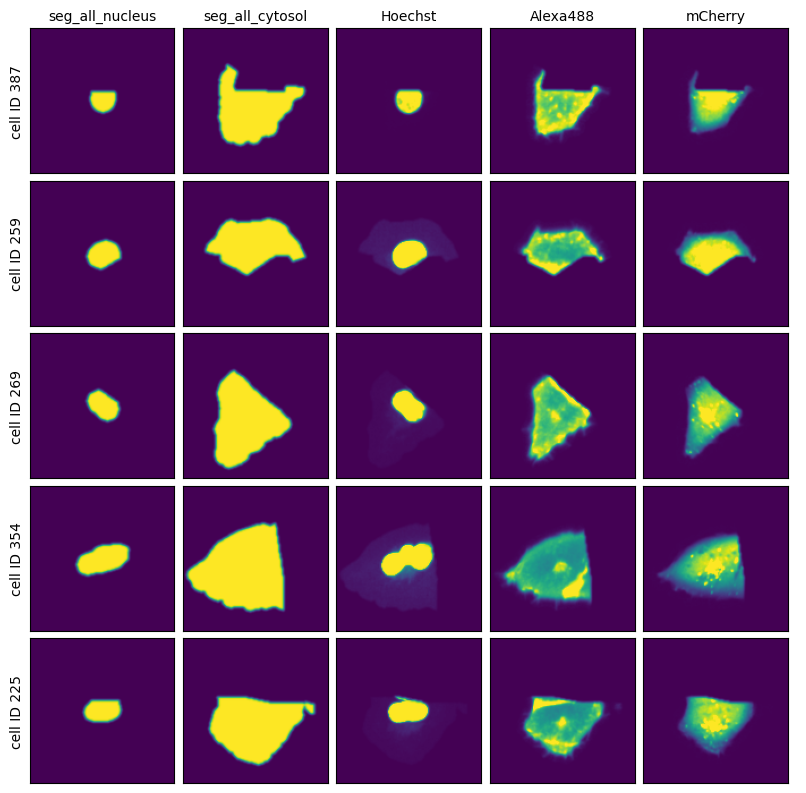

In [8]:
project.plot_single_cell_images()

In [10]:
project.featurize(overwrite = True)

Using extraction directory: /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/extraction/data/single_cells.h5sc
[20/03/2025 14:02:09] Initialized temporary directory at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/CellFeaturizer_v5jlgmi7 for CellFeaturizer
[20/03/2025 14:02:09] Started CellFeaturization of all available channels.
[20/03/2025 14:02:09] Overwrite flag is set, deleting existing directory for featurization results.
[20/03/2025 14:02:09] Created new directory for featurization results: /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/featurization/complete_CellFeaturizer
[20/03/2025 14:02:09] CPU specified in config file but MPS available on system. Consider changing the device for the next run.
[20/03/2025 14:02:09] Initialized temporary directory at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/exam

In [11]:
# load classification results
results = pd.read_csv(f"{project_location}/featurization/complete_CellFeaturizer/calculated_image_features.csv")
results

,nucleus_area,cytosol_area,cytosol_only_area,Hoechst_mean_nucleus,Hoechst_median_nucleus,Hoechst_quant75_nucleus,Hoechst_quant25_nucleus,Hoechst_summed_intensity_nucleus,Hoechst_summed_intensity_area_normalized_nucleus,Hoechst_mean_cytosol,...,mCherry_summed_intensity_cytosol,mCherry_summed_intensity_area_normalized_cytosol,mCherry_mean_cytosol_only,mCherry_median_cytosol_only,mCherry_quant75_cytosol_only,mCherry_quant25_cytosol_only,mCherry_summed_intensity_cytosol_only,mCherry_summed_intensity_area_normalized_cytosol_only,label,cell_id
0,1560.0,6189.0,4629.0,0.072425,0.0,0.028797,0.0,1186.60670,0.256342,0.072425,...,2583.87260,0.558192,0.157707,0.0,0.117477,0.0,2583.87260,0.558192,0,12
1,1451.0,7262.0,5819.0,0.048770,0.0,0.002569,0.0,799.05190,0.137318,0.048770,...,2430.84400,0.417743,0.148367,0.0,0.128967,0.0,2430.84400,0.417743,0,13
2,1529.0,6399.0,4892.0,0.050661,0.0,0.002369,0.0,830.02990,0.169671,0.050661,...,2385.55370,0.487644,0.145603,0.0,0.060219,0.0,2385.55370,0.487644,0,15
3,1579.0,3789.0,2262.0,0.066313,0.0,0.000000,0.0,1086.47000,0.480314,0.066313,...,1536.50280,0.679267,0.093781,0.0,0.000000,0.0,1536.50280,0.679267,0,18
4,1311.0,6037.0,4726.0,0.047081,0.0,0.001999,0.0,771.37480,0.163219,0.047081,...,1891.03760,0.400135,0.115420,0.0,0.020374,0.0,1891.03760,0.400135,0,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
309,599.0,2756.0,2157.0,0.022552,0.0,0.000000,0.0,369.49756,0.171302,0.022552,...,894.46330,0.414679,0.054594,0.0,0.000000,0.0,894.46330,0.414679,0,491
310,838.0,6042.0,5204.0,0.030730,0.0,0.001288,0.0,503.47302,0.096747,0.030730,...,1472.27340,0.282912,0.089860,0.0,0.003991,0.0,1472.27340,0.282912,0,493
311,583.0,3381.0,2798.0,0.019132,0.0,0.000000,0.0,313.46650,0.112032,0.019132,...,938.47780,0.335410,0.057280,0.0,0.000000,0.0,938.47780,0.335410,0,494
312,719.0,2246.0,1527.0,0.024316,0.0,0.000000,0.0,398.39990,0.260904,0.024316,...,804.29785,0.526718,0.049090,0.0,0.000000,0.0,804.29785,0.526718,0,495


In [12]:
#test selection workflow
selected_cells_large = results[results.cytosol_area > 4500]["cell_id"].tolist()
selected_cells_small = results[results.cytosol_area < 3000]["cell_id"].tolist()

cells_to_select = [
    {"name": "large_cells", "classes": selected_cells_large, "well": "A1"},
    {"name": "small_cells", "classes": selected_cells_small, "well": "B1"},
]

marker_0 = (0, 0)
marker_1 = (2000, 0)
marker_2 = (0, 2000)

calibration_marker = np.array([marker_0, marker_1, marker_2])


[20/03/2025 14:02:17] Initialized temporary directory at /var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/./LMDSelection_4j60paha for LMDSelection
[20/03/2025 14:02:17] Selection process started.


Processing cell batches:   0%|          | 0/3 [00:00<?, ?it/s]

[20/03/2025 14:02:28] Temporary directory not found, skipping cleanup
[20/03/2025 14:02:28] Temporary directory not found, skipping cleanup
[20/03/2025 14:02:28] Temporary directory not found, skipping cleanup
[20/03/2025 14:02:29] Coordinate lookup index calculation took 11.725746958050877 seconds.
No configuration for shape_erosion found, parameter will be set to 0
No configuration for binary_smoothing found, parameter will be set to 3
No configuration for convolution_smoothing found, parameter will be set to 15
No configuration for rdp_epsilon found, parameter will be set to 0.1
No configuration for xml_decimal_transform found, parameter will be set to 100
No configuration for distance_heuristic found, parameter will be set to 300
No configuration for join_intersecting found, parameter will be set to True
Path optimizer used for XML generation: hilbert
cell set 0 passed sanity check
cell set 1 passed sanity check
Loading coordinates from external source
Processing cell sets in paral

collecting cell sets:   0%|          | 0/2 [00:00<?, ?it/s]

Convert label format into coordinate format
Conversion finished, performing sanity check.
Intersecting Shapes will be merged into a single shape.
Convert label format into coordinate format
Conversion finished, performing sanity check.
Intersecting Shapes will be merged into a single shape.


dilating shapes: 100%|██████████| 186/186 [00:03<00:00, 47.06it/s]


0 shapes that were intersecting were found and merged.


creating shapes:   0%|          | 0/22 [00:00<?, ?it/s]

0 shapes that were intersecting were found and merged.


calculating polygons: 100%|██████████| 22/22 [00:03<00:00,  5.99it/s]


Current path length: 38,361.08 units
Optimized path length: 12,330.69 units
Optimization factor: 3.1x
Plotting shapes in debug mode is not supported in multi-threading mode.
Saving plots to disk instead.


calculating polygons: 100%|██████████| 124/124 [00:04<00:00, 29.31it/s]


Current path length: 163,419.34 units
Optimized path length: 30,697.93 units
Optimization factor: 5.3x
Plotting shapes in debug mode is not supported in multi-threading mode.
Saving plots to disk instead.


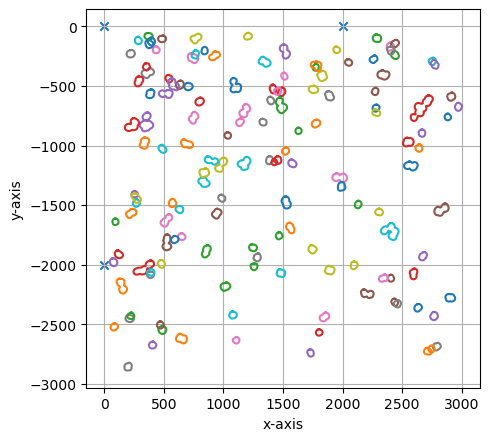

===== Collection Stats =====
Number of shapes: 146
Number of vertices: 11,167
Mean vertices: 76
Min vertices: 52
5% percentile vertices: 57
Median vertices: 68
95% percentile vertices: 111
Max vertices: 233
[0 0]
[      0 -200000]
[200000      0]
[20/03/2025 14:02:45] Saved output at /Users/sophia/Documents/GitHub/scPortrait/examples/notebooks/example_projects/example_1/project_WGA/selection/large_cells_small_cells.xml
[20/03/2025 14:02:45] Cleaned up temporary directory at <TemporaryDirectory '/var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/./LMDSelection_4j60paha'>


In [13]:
project.select(cells_to_select, calibration_marker)